<a href="https://colab.research.google.com/github/stevenwcliu/188-learning/blob/main/3_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Module 3 Assignment, Part 2

## Section 0: Setup & initialization

### Setting up your environment  

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import random
import os
import numpy as np
from scipy import stats
import seaborn as sns

###  Loading the data

Now we authenticate a Google Drive client to mount your drive and access the data file.

**Make sure to follow the interactive instructions.**

In [4]:
from google.colab import drive
drive.mount('/content/drive')
os.chdir('/content/drive/MyDrive/188 M3')

Mounted at /content/drive


In [5]:
df = pd.read_csv('diabetes_data_m3.csv')
df.index = df['Unnamed: 0']
df = df.drop(['Unnamed: 0'], axis=1)
df.index.names = ['DF Index']

In [6]:
df.head()
print(len(df))
# df.loc[:6,'encounter_id': 'age'] # rows, cols


13016


##Section 1: Naive Bayes

### 1\. Split the diabetes dataset into a training and test sets

In [7]:
from sklearn.model_selection import train_test_split
# target: diabetes_mellitus | training: everything else
# iloc: integer location
X = df.iloc[:,:-1]
y = df.iloc[:,-1]
# x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.5, random_state = 100)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.33, random_state = 42)

print(X_train)
# random_state is ??
# .33 is good for for knn big data set

# X= df.iloc[:,:-1]
# print(X)
# #X= df.loc[:,"hospital_id":"age"]
# y= df.iloc[:,-1]
# print(y)
# X_train, X_test, y_train,y_test = train_test_split(X,y,random_state=66,test_size=0.33)
#Dont standardize because not needed for Naive Baye


          encounter_id  hospital_id   age        bmi  elective_surgery  \
DF Index                                                                 
6110            207001          149  75.0  29.139754                 0   
9921            275573           97  86.0  31.275847                 0   
4411            257583           53  76.0  29.139754                 1   
11257           273571          157  86.0  25.683477                 0   
5653            237365          114  66.0  25.781250                 0   
...                ...          ...   ...        ...               ...   
11964           246420          103  72.0  33.742423                 1   
5191            188493           70  82.0  27.639801                 0   
5390            209873            7  63.0  22.160690                 1   
860             184829           18  60.0  37.305896                 0   
7270            244627          118  75.0  45.638980                 1   

          ethnicity  gender  height  

### 2\. Train a Naive Bayes classifier on the diabetes data 

In [8]:
# from sklearn.naive_bayes import GaussianNB
# gnb = GaussianNB()
# y_pred = gnb.fit(X_train, y_train).predict(X_test)
# print("Number of mislabeled points out of a total %d points : %d" % (X_test.shape[0], (y_test != y_pred).sum()))

from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
y_pred = gnb.fit(X_train, y_train).predict(X_test)
print("Number of mislabeled points:", (y_test != y_pred).sum() ,"out of" , X_test.shape[0])


Number of mislabeled points: 1038 out of 4296


### 3\. Use your classifier on your test data & show the [classification_report](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.classification_report.html) for its performance

In [9]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

# macro average: each class has the same weight regardless of the sample size

              precision    recall  f1-score   support

           0       0.85      0.84      0.84      3360
           1       0.45      0.47      0.46       936

    accuracy                           0.76      4296
   macro avg       0.65      0.66      0.65      4296
weighted avg       0.76      0.76      0.76      4296



### 4\. Show the confusion matrix heatmap for the predictions

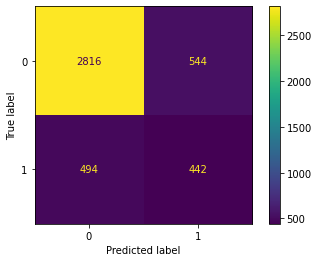

In [10]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = (confusion_matrix(y_test, y_pred))
disp = ConfusionMatrixDisplay(cm)
disp.plot()

## Section 2: Decision Tree

### 1\.  Train a Decision Tree Classifier on the diabetes data

In [11]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
# clf = DecisionTreeClassifier(random_state=42)
# iris = load_iris()
# cross_val_score(clf, iris.data, iris.target, cv=10)

clf = tree.DecisionTreeClassifier(random_state=42)
clf = clf.fit(X_train, y_train)
# tree.plot_tree(clf)


### 2\. Use your classifier on your test data & show the [classification_report](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.classification_report.html) for its performance

In [12]:
from sklearn.metrics import classification_report
# classification report: text summary of precision, recall, f1-score for each class
y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.85      0.83      0.84      3360
           1       0.43      0.46      0.45       936

    accuracy                           0.75      4296
   macro avg       0.64      0.65      0.64      4296
weighted avg       0.76      0.75      0.75      4296



### 3\. Show the confusion matrix heatmap for the predictions

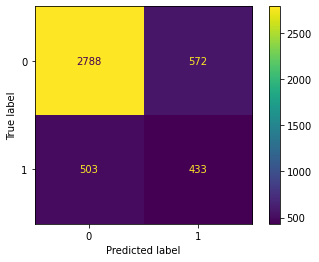

In [13]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = (confusion_matrix(y_test, y_pred))
disp = ConfusionMatrixDisplay(cm)
disp.plot()

### 4\. Visualize the decision tree as a [tree diagram](https://https://scikit-learn.org/stable/modules/generated/sklearn.tree.plot_tree.html)

[Text(0.5313197185856869, 0.9857142857142858, 'X[106] <= 189.5\ngini = 0.343\nsamples = 8720\nvalue = [6801, 1919]'),
 Text(0.24173915233790916, 0.9571428571428572, 'X[106] <= 137.5\ngini = 0.208\nsamples = 6329\nvalue = [5584, 745]'),
 Text(0.09905518345017415, 0.9285714285714286, 'X[105] <= 1.355\ngini = 0.132\nsamples = 3376\nvalue = [3137, 239]'),
 Text(0.05101336088456122, 0.9, 'X[106] <= 113.5\ngini = 0.092\nsamples = 2558\nvalue = [2434, 124]'),
 Text(0.023630473902611478, 0.8714285714285714, 'X[167] <= 7.165\ngini = 0.048\nsamples = 1371\nvalue = [1337, 34]'),
 Text(0.02214681157488438, 0.8428571428571429, 'gini = 0.0\nsamples = 1\nvalue = [0, 1]'),
 Text(0.025114136230338577, 0.8428571428571429, 'X[88] <= 184.5\ngini = 0.047\nsamples = 1370\nvalue = [1337, 33]'),
 Text(0.018474421313736628, 0.8142857142857143, 'X[67] <= 135.5\ngini = 0.044\nsamples = 1364\nvalue = [1333, 31]'),
 Text(0.009645978463714023, 0.7857142857142857, 'X[16] <= 1.25\ngini = 0.037\nsamples = 1317\nvalue 

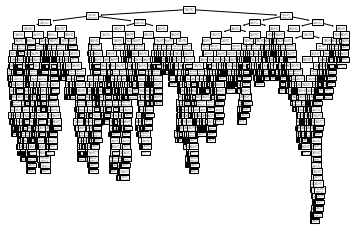

In [14]:
from sklearn import tree
tree.plot_tree(clf)


### 5\. Visualize the decision tree as a text based diagram

In [15]:
# research on the second approach

# ref: https://mljar.com/blog/visualize-decision-tree/

from sklearn.tree import export_text
# text_representation = tree.export_text(clf)
# print(text_representation)

# alternative 
trainColumns = df.columns.drop('diabetes_mellitus') # drop the last col
# r = export_text(clf,feature_names = X_train.columns)
r = export_text(clf)
print(r)


|--- feature_106 <= 189.50
|   |--- feature_106 <= 137.50
|   |   |--- feature_105 <= 1.36
|   |   |   |--- feature_106 <= 113.50
|   |   |   |   |--- feature_167 <= 7.16
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- feature_167 >  7.16
|   |   |   |   |   |--- feature_88 <= 184.50
|   |   |   |   |   |   |--- feature_67 <= 135.50
|   |   |   |   |   |   |   |--- feature_16 <= 1.25
|   |   |   |   |   |   |   |   |--- feature_118 <= 144.00
|   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |--- feature_118 >  144.00
|   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |--- feature_16 >  1.25
|   |   |   |   |   |   |   |   |--- feature_51 <= 134.50
|   |   |   |   |   |   |   |   |   |--- feature_136 <= 75.50
|   |   |   |   |   |   |   |   |   |   |--- feature_0 <= 254923.00
|   |   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |   |   |--- feature_0 >  254923.00
|   |   |   |   |   | 

### 6\.  Show the feature importances computed by the classifier

In [16]:
importance = clf.feature_importances_
print(importance)

[9.73583594e-03 1.21092794e-02 1.77809859e-02 2.03781502e-02
 4.91995430e-04 1.83520009e-03 2.20369623e-03 1.29482808e-02
 3.22115325e-03 3.70994820e-03 1.32559474e-02 0.00000000e+00
 2.10641290e-03 1.34661419e-02 0.00000000e+00 1.57671485e-02
 5.69379644e-03 1.10159391e-02 3.69116102e-03 3.34070971e-04
 6.64254829e-03 5.79999004e-03 3.23210017e-03 2.53671920e-03
 1.26247314e-03 1.50640039e-03 4.58194313e-03 0.00000000e+00
 9.70396631e-04 1.82548867e-02 1.64923518e-02 9.66985880e-03
 0.00000000e+00 6.06607192e-03 1.31954765e-03 2.14659903e-03
 3.33754389e-03 4.77714185e-03 5.37468147e-03 7.72126243e-03
 8.01731080e-03 8.01548971e-03 3.34070971e-04 5.20310494e-03
 1.14044060e-03 0.00000000e+00 3.47987334e-03 6.35777079e-03
 2.99429316e-03 2.17983336e-03 1.10301369e-02 1.35708720e-02
 4.78070731e-03 2.59120023e-03 3.50376015e-03 2.84213277e-03
 5.51656577e-03 1.74917200e-03 4.44618640e-03 5.90061537e-03
 9.42702239e-04 4.47490804e-03 9.83201686e-03 2.92683487e-03
 6.44759752e-03 3.887221

### 7\. Create a bar chart of the feature importances with importance level on the x-axis, and the features on the y-axis

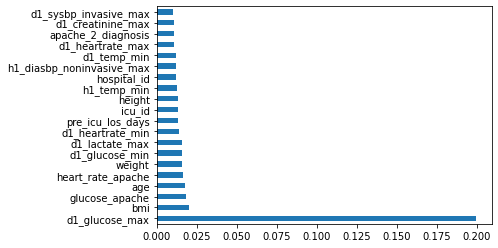

In [17]:
# ref: https://stackoverflow.com/questions/44511636/plot-feature-importance-with-feature-names
feat_importances = pd.Series(importance, index = X_train.columns)
feat_importances.nlargest(20).plot(kind='barh')

## Section 3: Random Forest Classifier

### 1\.  Train a Random Forest Classifier on the diabetes data

In [18]:
# https://www.datacamp.com/community/tutorials/random-forests-classifier-python

from sklearn.ensemble import RandomForestClassifier
# n_estimators: the number of trees you want to build before taking the maximum voting or averages of predictions; the number of trees in the forest
clf = RandomForestClassifier(n_estimators=100, random_state= 42)
clf = clf.fit(X_train, y_train)


### 2\. Use your classifier on your test data & show a [classification_report](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.classification_report.html) for its performance

In [19]:
from sklearn.metrics import classification_report
# classification report: text summary of precision, recall, f1-score for each class
y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.83      0.96      0.89      3360
           1       0.65      0.29      0.40       936

    accuracy                           0.81      4296
   macro avg       0.74      0.62      0.64      4296
weighted avg       0.79      0.81      0.78      4296



### 3\. Show the confusion matrix heatmap for the predictions

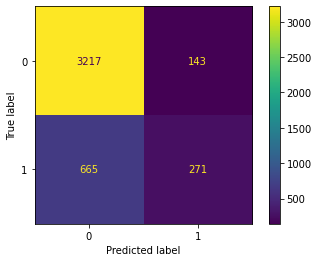

In [20]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = (confusion_matrix(y_test, y_pred))
disp = ConfusionMatrixDisplay(cm)
disp.plot()

### Run the following cells to visualize the Random Forest

In [21]:
# print(y.unique())

In [22]:
# ref: https://scikit-learn.org/stable/modules/generated/sklearn.tree.export_graphviz.html
from sklearn.tree import export_graphviz

# Export as dot file
estimator = clf.estimators_[5]

export_graphviz(estimator, out_file='tree.dot', 
                feature_names = X_train.columns, # list of str
                class_names = str(y.unique()), # y: target col # get the values in the target col
                rounded = True, proportion = False, 
                precision = 2, filled = True)

'''
feature_names = x_train.columns.values
class_names = y.astype('U').unique()
'''


"\nfeature_names = x_train.columns.values\nclass_names = y.astype('U').unique()\n"

In [23]:
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

0

In [24]:
from IPython.display import Image
Image(filename = 'tree.png')

### 4\. Print out the [feature_importances_](https://https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html) computed by the classifier

In [25]:
importance = clf.feature_importances_
print(importance)

[9.36703440e-03 8.86086189e-03 1.12843433e-02 1.95551932e-02
 7.08038553e-04 2.45930752e-03 9.81814709e-04 7.51587028e-03
 3.17082405e-03 1.70200670e-03 8.09453253e-03 4.76729467e-04
 3.26246796e-03 7.68356812e-03 0.00000000e+00 1.60713733e-02
 4.17770976e-03 7.13406469e-03 8.22755684e-03 5.58113448e-04
 2.84905230e-03 3.78905920e-03 7.21710284e-03 9.47948074e-03
 2.76500340e-03 2.33080912e-03 2.35420235e-03 3.91577536e-04
 2.14065719e-03 6.51888188e-02 8.06090906e-03 6.55032316e-03
 9.89363459e-04 6.79259627e-03 2.36757748e-03 2.46447508e-03
 3.04127274e-03 2.71439038e-03 6.85115092e-03 5.30887211e-03
 6.10423526e-03 6.99383957e-03 1.81392823e-03 7.50787823e-03
 3.42519888e-03 3.27345151e-03 7.13142567e-03 6.54812944e-03
 7.21810849e-03 6.30508579e-03 8.32456297e-03 8.13448306e-03
 3.46985188e-03 3.12856954e-03 7.33926621e-03 5.86085046e-03
 7.31676758e-03 6.10487006e-03 6.91542933e-03 6.16279754e-03
 2.84012659e-03 5.96709456e-03 3.60375364e-03 4.01471676e-03
 8.58583326e-03 7.555345

### 5\. Create a bar chart of the feature importances with importance level on the x-axis, and the features on the y-axis

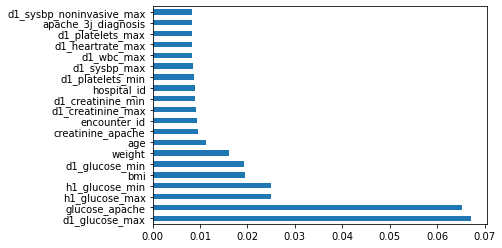

In [26]:
# ref: https://stackoverflow.com/questions/44511636/plot-feature-importance-with-feature-names
feat_importances = pd.Series(importance, index = X_train.columns)
feat_importances.nlargest(20).plot(kind='barh')

## Section 4: XGB Classifier

### 1\. Train an XGB Classifier on the diabetes data


In [27]:
# https://www.datacamp.com/community/tutorials/xgboost-in-python 
# ref: https://www.kaggle.com/code/stuarthallows/using-xgboost-with-scikit-learn/notebook
import xgboost as xgb
xgb_clf = xgb.XGBClassifier(objective="binary:logistic", random_state=42, eval_metric="auc")

xgb_clf.fit(X_train, y_train, early_stopping_rounds=5, eval_set=[(X_test, y_test)])

y_pred = xgb_clf.predict(X_test)


[0]	validation_0-auc:0.782899
Will train until validation_0-auc hasn't improved in 5 rounds.
[1]	validation_0-auc:0.784903
[2]	validation_0-auc:0.791175
[3]	validation_0-auc:0.798682
[4]	validation_0-auc:0.802664
[5]	validation_0-auc:0.804459
[6]	validation_0-auc:0.805596
[7]	validation_0-auc:0.810956
[8]	validation_0-auc:0.809864
[9]	validation_0-auc:0.811169
[10]	validation_0-auc:0.811966
[11]	validation_0-auc:0.811818
[12]	validation_0-auc:0.811659
[13]	validation_0-auc:0.811995
[14]	validation_0-auc:0.811887
[15]	validation_0-auc:0.812859
[16]	validation_0-auc:0.813562
[17]	validation_0-auc:0.814445
[18]	validation_0-auc:0.815137
[19]	validation_0-auc:0.815848
[20]	validation_0-auc:0.815957
[21]	validation_0-auc:0.816742
[22]	validation_0-auc:0.817348
[23]	validation_0-auc:0.817525
[24]	validation_0-auc:0.817716
[25]	validation_0-auc:0.81848
[26]	validation_0-auc:0.818728
[27]	validation_0-auc:0.819712
[28]	validation_0-auc:0.820397
[29]	validation_0-auc:0.820578
[30]	validation_0-

### 2\. Use your classifier on your test data & show the [classification_report](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.classification_report.html) for its performance

In [28]:
# from sklearn.metrics import classification_report
# classification report: text summary of precision, recall, f1-score for each class
# y_pred = xgb_clf.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.85      0.94      0.89      3360
           1       0.65      0.41      0.50       936

    accuracy                           0.82      4296
   macro avg       0.75      0.67      0.70      4296
weighted avg       0.81      0.82      0.81      4296



### 3\. Show the confusion matrix heatmap for the predictions

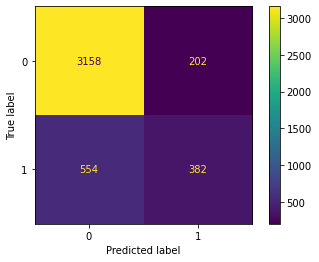

In [29]:
# from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = (confusion_matrix(y_test, y_pred))
disp = ConfusionMatrixDisplay(cm)
disp.plot()